In [ ]:
import sys
sys.path.append('..')

from scripts import graph_osm_loader, clustering
from scripts.filtration import FiltrationClustering

# from scripts.graph_filtration.utils import plot_simplex
from scripts.graph_filtration.clustering import build_knn_graph

import matplotlib.pyplot as plt
import imageio.v3 as iio
from IPython.display import Image

import igraph as ig
import networkx as nx
import numpy as np

from tqdm.notebook import tqdm

from random import randint
from joblib import Parallel, delayed

In [2]:
# def cluster_sum(G_cluster, weight='length'):
#     total_dist = 0.0
#     center = nx.barycenter(G_cluster, weight=weight)
#     d = nx.multi_source_dijkstra_path_length(G_cluster, center)
#     return np.sum(list(d.values()))

# def optimal_clustering(G, clusters_set, weight='length'):
#     min_dist = np.inf
#     min_id = -1

#     debug = []
#     for i, clusters in enumerate(clusters_set):
#         total_dist = 0.0
#         for cluster in clusters:
#             G_cluster = G.subgraph(cluster)
#             total_dist += cluster_sum(G_cluster, weight) / len(cluster)
#             # if total_dist > min_dist:
#             #     break 
#         debug.append(total_dist)
#         if total_dist < min_dist:
#             min_dist = total_dist
#             min_id = i
#     return min_id, debug

Medium size cities:
- `R1853866` - 5k
- `KRG` - 3k
- `ASHA` - 715
- `R3305920` - 1k

# ASHA

Text(0.5, 1.0, 'Asha | 723 nodes')

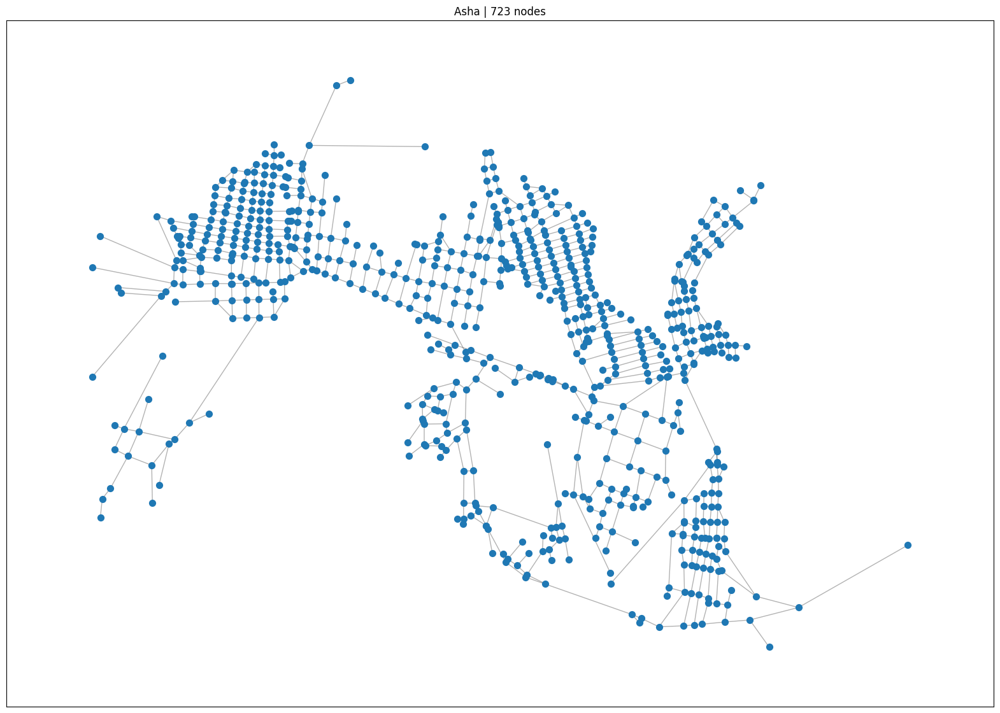

In [3]:
CITY = 'ASHA'
GRAPH_ID = graph_osm_loader.cities[CITY] # KRG

# примеры id есть в graph_osm_loader.py
G = graph_osm_loader.get_graph(GRAPH_ID) # загрузка графа

pos = {u: [d['x'], d['y']] for u,d in G.nodes(data=True)} 

A = nx.adjacency_matrix(G, weight='length').todense()


plt.figure(figsize=(20, 14))
nx.draw_networkx_nodes(G, pos, node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.3)
plt.title(f'Asha | {len(G.nodes)} nodes')

In [4]:
d_dict = dict(nx.all_pairs_dijkstra_path_length(G, weight='length'))
d_matrix = np.zeros((len(G.nodes), len(G.nodes)))
id_to_order = {id : order for order, id in enumerate(G.nodes)}

for row in d_dict:
    for v in d_dict[row]:
        d_matrix[id_to_order[row]][id_to_order[v]] = d_dict[row][v]

## Louvain

In [5]:
communities = nx.community.louvain_communities(G, weight='length')
score = nx.community.modularity(G, communities, weight='length')
print(f'Modularity: {score:.5f}')

Modularity: 0.92138


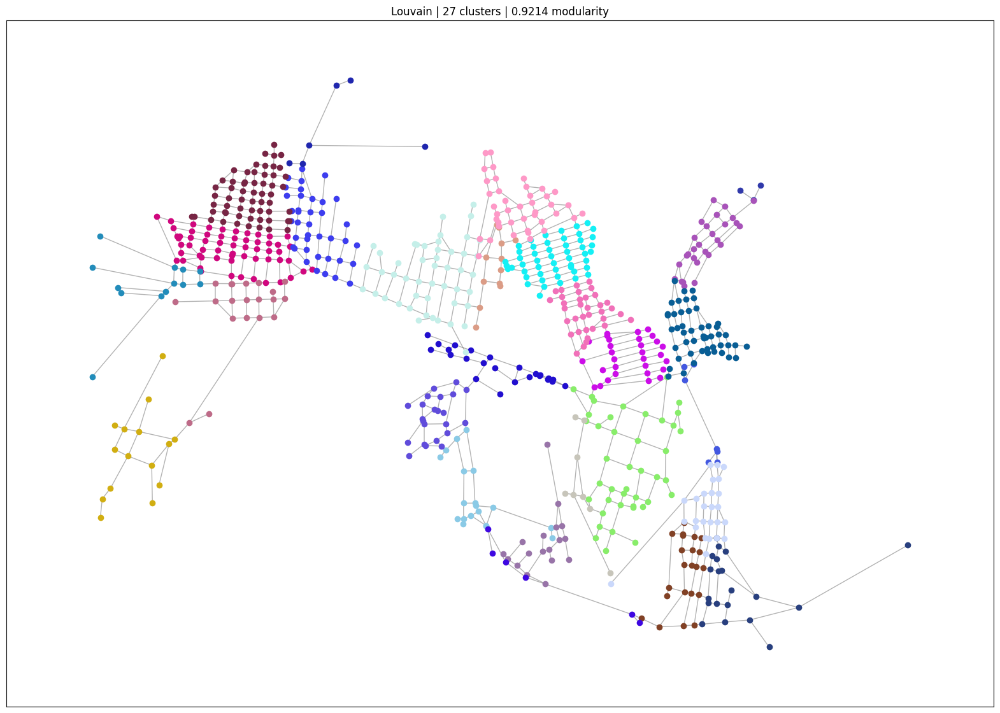

In [6]:
def plot_communities(communities, algo_name=''):
    plt.figure(figsize=(20, 14))

    nx.draw_networkx_edges(G, pos, alpha=0.3)

    for j, cluster in enumerate(communities):
        color = '#%06X' % randint(0, 0xFFFFFF)
        for v in cluster:
            point = pos[v]
            plt.scatter(point[0], point[1], c=color)

    plt.title(f'{algo_name} | {len(communities)} clusters | {score:.4f} modularity')

plot_communities(communities, 'Louvain')

## Leiden

Modularity: 0.92252


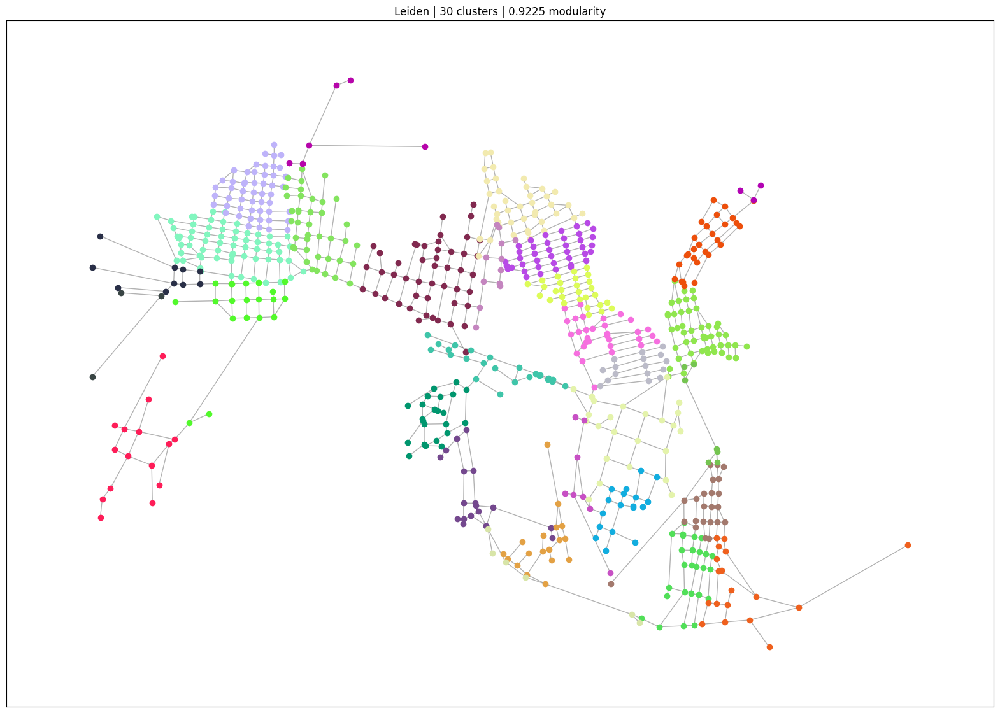

In [7]:
import leidenalg as la

seed = 0

communities = clustering.leiden(G, partition_type=la.ModularityVertexPartition, seed=seed, weights='length')
score = nx.community.modularity(G, communities, weight='length')
print(f'Modularity: {score:.5f}')

plot_communities(communities, 'Leiden')

## Filtration

 --- k=3 --- 
Louvain Modularity: 0.93824
Leiden Modularity: 0.93993
 --- k=5 --- 
Louvain Modularity: 0.91953
Leiden Modularity: 0.91879
 --- k=7 --- 
Louvain Modularity: 0.90579
Leiden Modularity: 0.90672
 --- k=10 --- 
Louvain Modularity: 0.88138
Leiden Modularity: 0.88541
 --- k=15 --- 
Louvain Modularity: 0.85484
Leiden Modularity: 0.85759


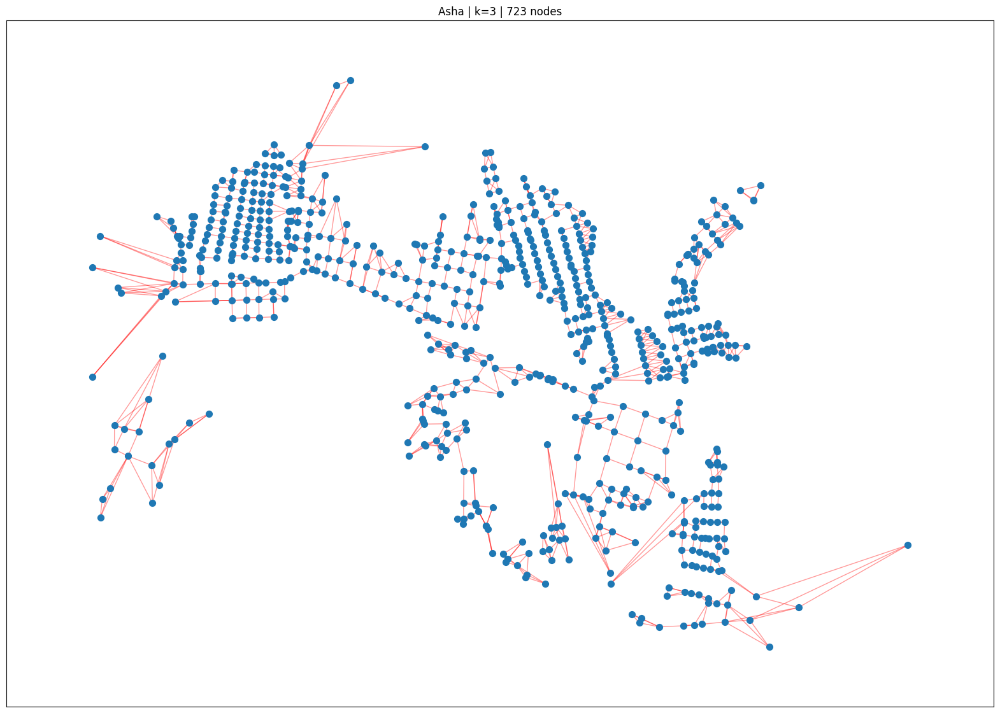

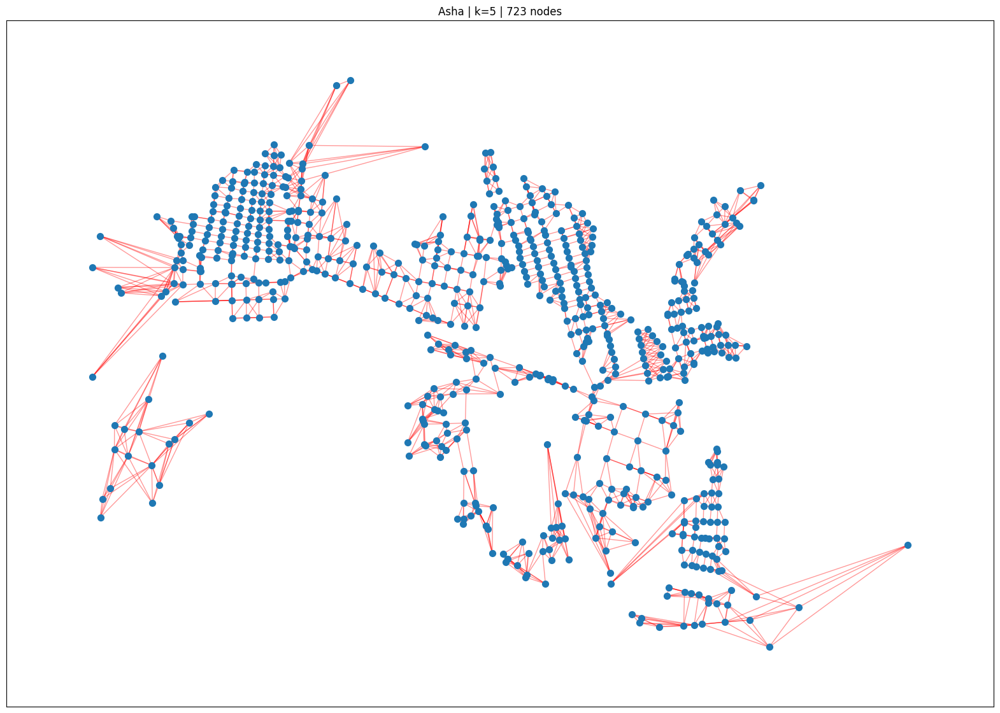

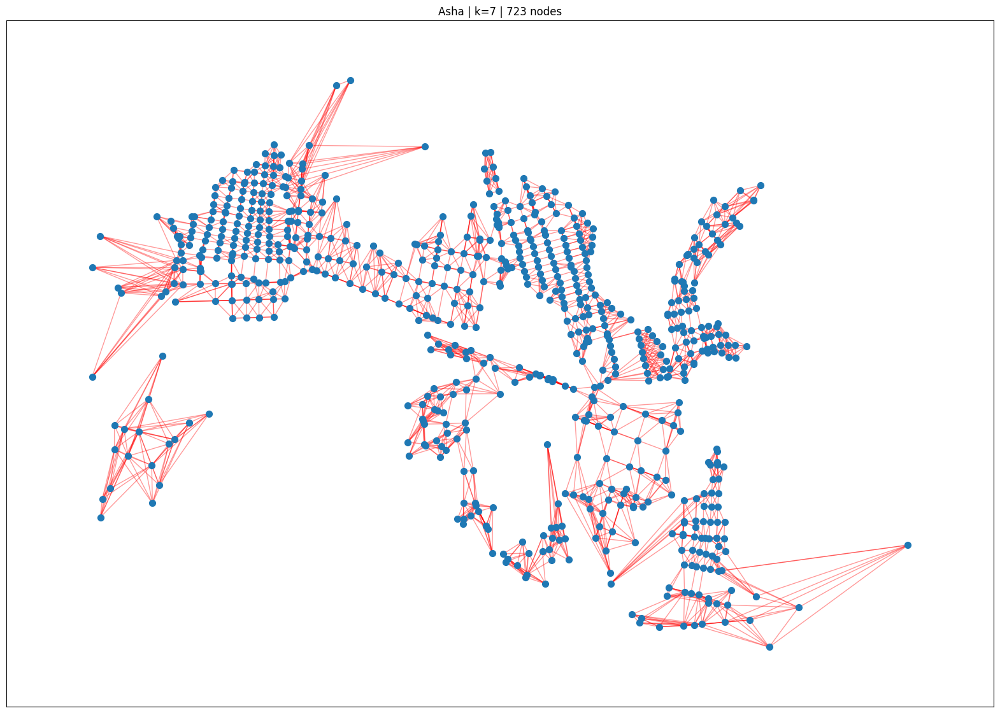

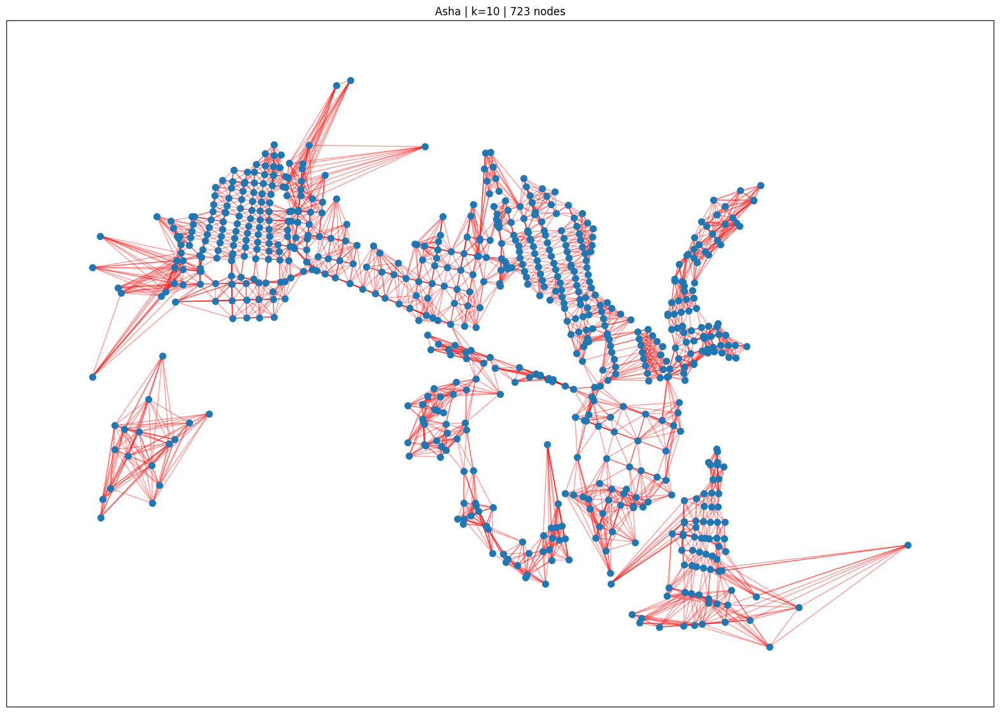

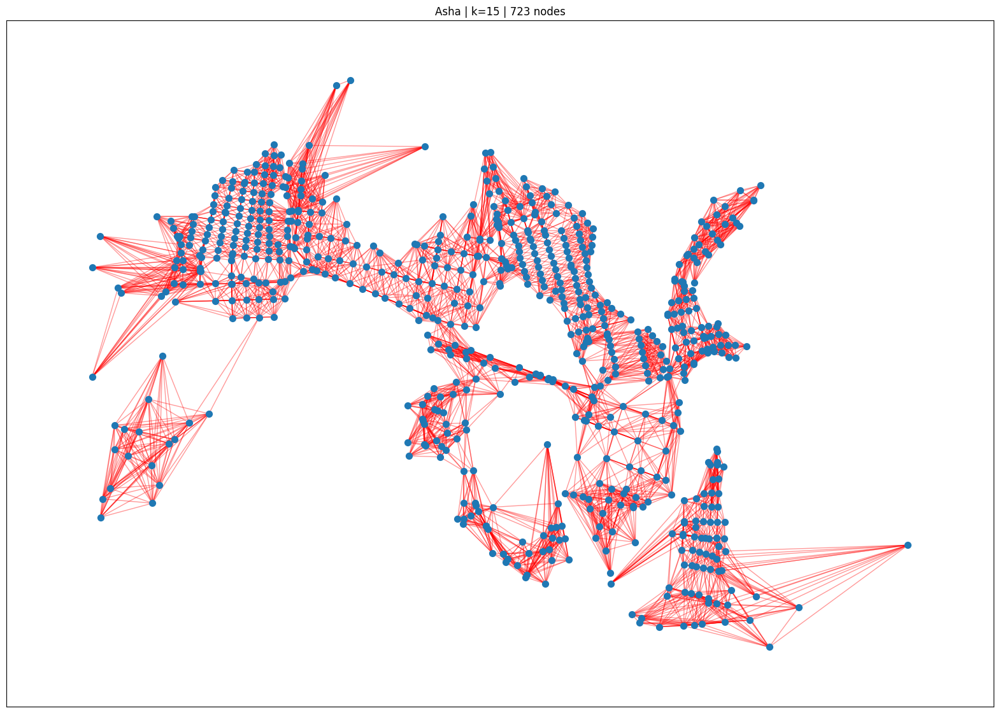

In [8]:
knn_graph = {k : build_knn_graph(G, k=k, weight='length') for k in [3, 5, 7, 10, 15]}

for k, G_knn in knn_graph.items():
    print(f' --- k={k} --- ')

    plt.figure(figsize=(20, 14))
    nx.draw_networkx_nodes(G, pos, node_size=50)
    nx.draw_networkx_edges(G_knn, pos, alpha=0.4, edge_color='r')
    plt.title(f'Asha | k={k} | {len(G.nodes)} nodes')

    communities = nx.community.louvain_communities(G_knn, weight='length')
    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'Louvain Modularity: {score:.5f}')

    communities = clustering.leiden(G_knn, partition_type=la.ModularityVertexPartition, seed=seed, weights='length')
    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'Leiden Modularity: {score:.5f}')

 --- k=3 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:02<00:00, 37.31it/s]


Finding best clustering


100%|██████████| 100/100 [00:00<00:00, 709.08it/s]


Best threshold 89.8800 with score: 0.8781962119748702


100%|██████████| 10/10 [00:00<00:00, 22.05it/s]


k = 3 | Modularity: 0.88109
 --- k=5 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:00<00:00, 127.87it/s]


Finding best clustering


100%|██████████| 100/100 [00:00<00:00, 569.36it/s]


Best threshold 2456.0039 with score: 0.8658355999336024


100%|██████████| 10/10 [00:00<00:00, 22.59it/s]


k = 5 | Modularity: 0.87332
 --- k=7 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:00<00:00, 139.12it/s]


Finding best clustering


100%|██████████| 100/100 [00:00<00:00, 498.40it/s]


Best threshold 93.5548 with score: 0.8212462361502543


100%|██████████| 10/10 [00:00<00:00, 17.44it/s]


k = 7 | Modularity: 0.82745
 --- k=10 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:00<00:00, 133.78it/s]


Finding best clustering


100%|██████████| 100/100 [00:00<00:00, 405.13it/s]


Best threshold 306.7672 with score: 0.7516526438377917


100%|██████████| 10/10 [00:00<00:00, 11.69it/s]


k = 10 | Modularity: 0.76219
 --- k=15 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:00<00:00, 120.24it/s]


Finding best clustering


100%|██████████| 100/100 [00:00<00:00, 315.69it/s]


Best threshold 307.9558 with score: 0.6747628321367319


100%|██████████| 10/10 [00:00<00:00, 21.72it/s]


k = 15 | Modularity: 0.67763


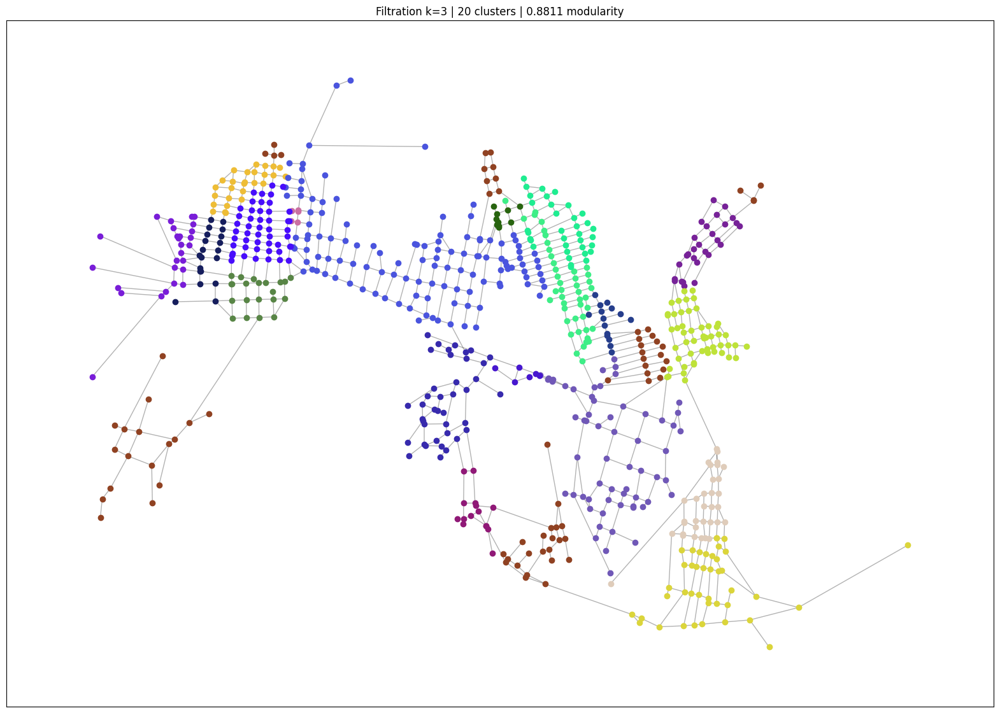

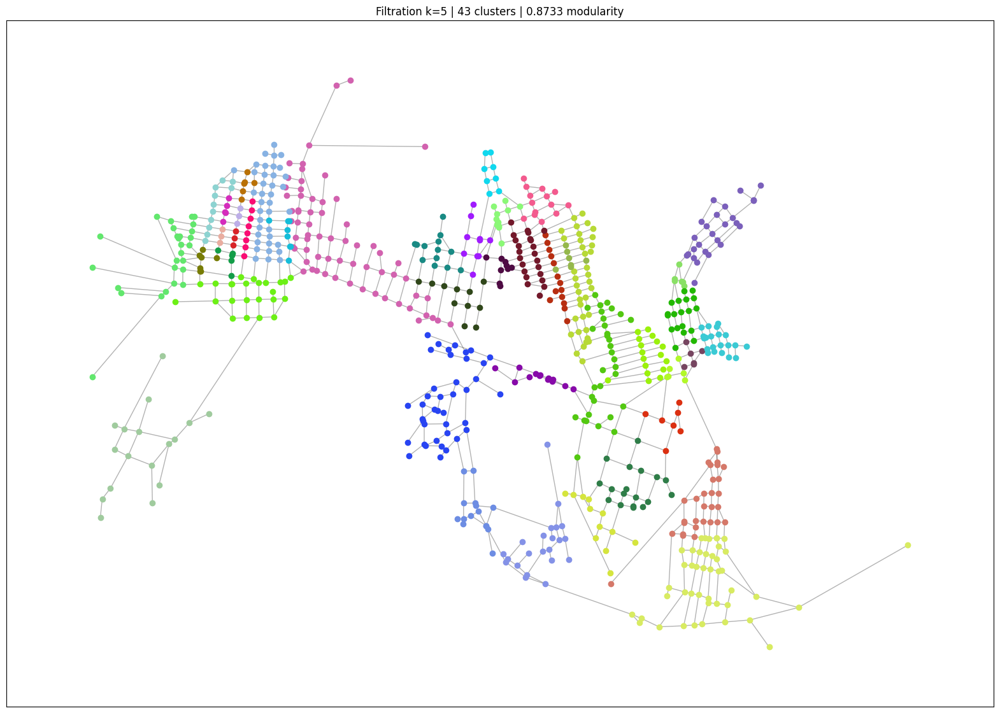

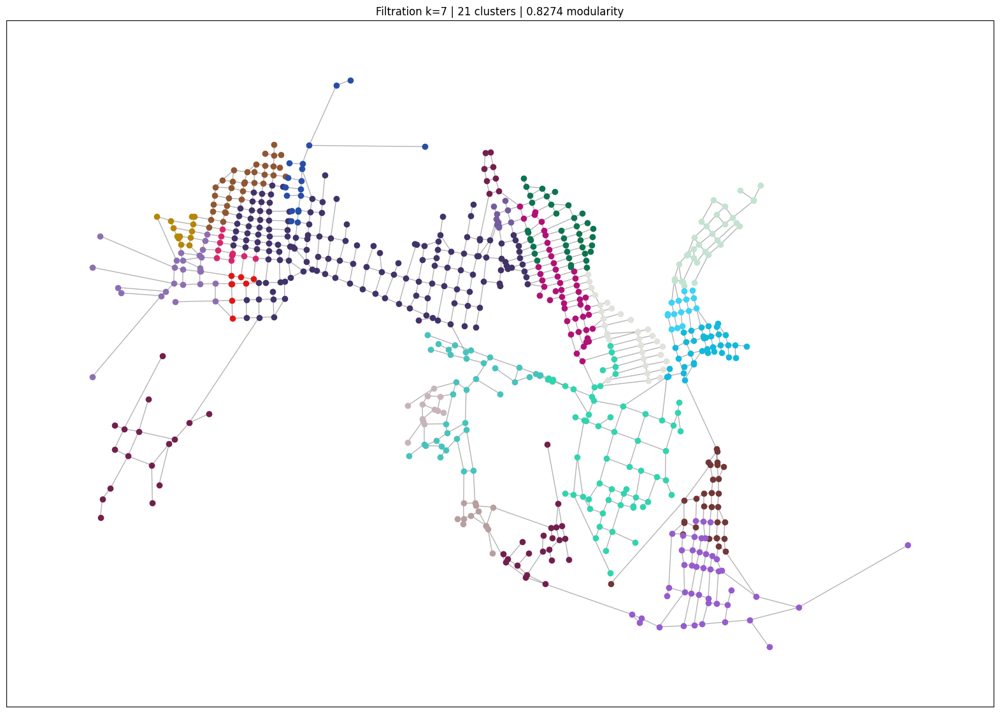

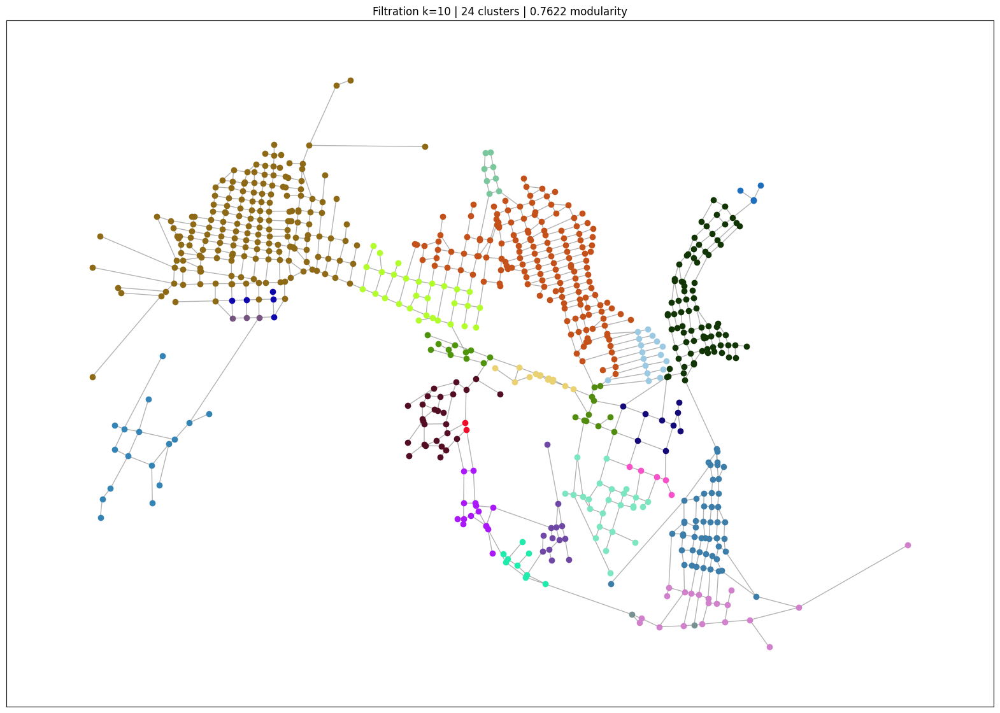

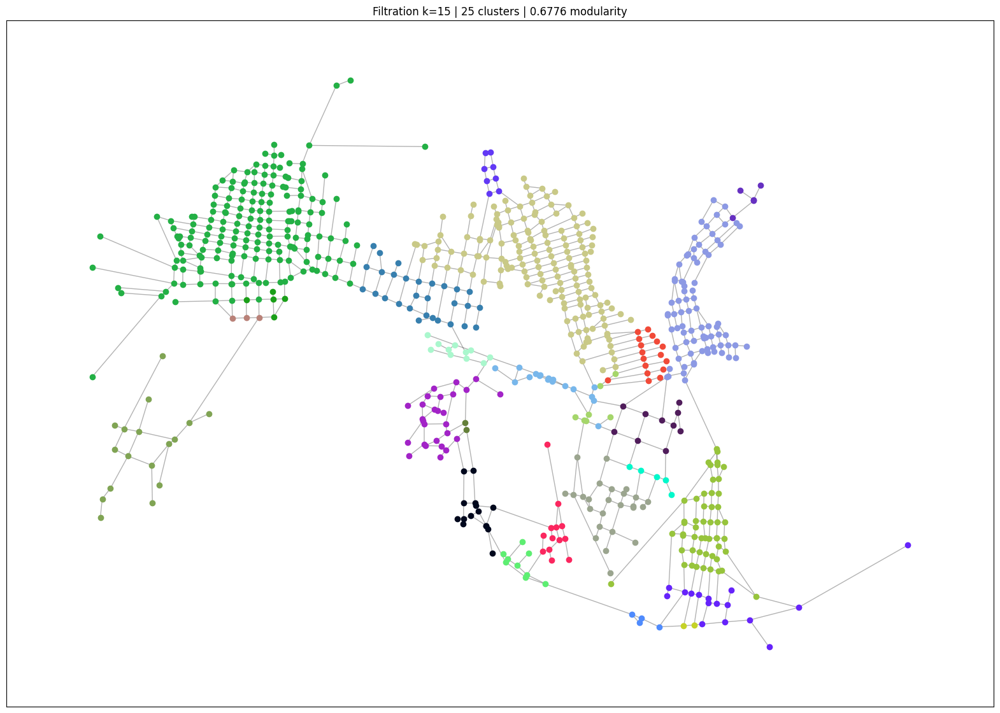

In [9]:
np.random.seed(0)

for k, G_knn in knn_graph.items():
    print(f' --- k={k} --- ')
    fc = FiltrationClustering(G_knn)
    communities = fc.cluster(n_jobs=7)

    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'k = {k} | Modularity: {score:.5f}')

    plot_communities(communities, f'Filtration k={k}')

# KRG

Text(0.5, 1.0, 'Asha | 3345 nodes')

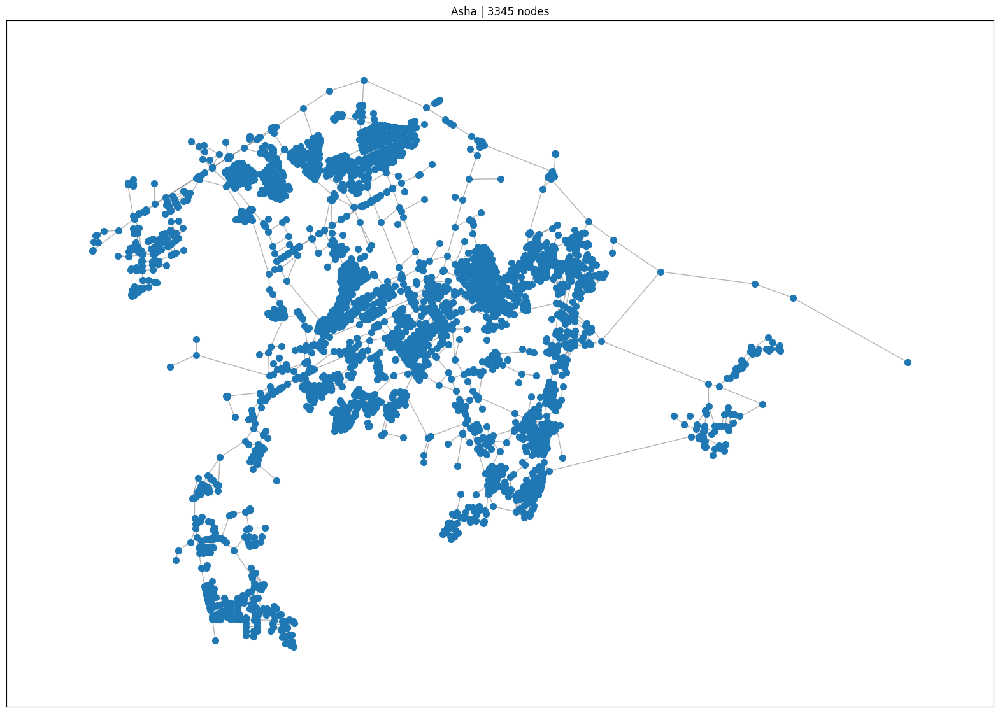

In [10]:
CITY = 'KRG'
GRAPH_ID = graph_osm_loader.cities[CITY] # KRG

# примеры id есть в graph_osm_loader.py
G = graph_osm_loader.get_graph(GRAPH_ID) # загрузка графа

pos = {u: [d['x'], d['y']] for u,d in G.nodes(data=True)} 

A = nx.adjacency_matrix(G, weight='length').todense()


plt.figure(figsize=(20, 14))
nx.draw_networkx_nodes(G, pos, node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.3)
plt.title(f'Asha | {len(G.nodes)} nodes')

In [11]:
d_dict = dict(nx.all_pairs_dijkstra_path_length(G, weight='length'))
d_matrix = np.zeros((len(G.nodes), len(G.nodes)))
id_to_order = {id : order for order, id in enumerate(G.nodes)}

for row in d_dict:
    for v in d_dict[row]:
        d_matrix[id_to_order[row]][id_to_order[v]] = d_dict[row][v]

## Louvain

In [12]:
communities = nx.community.louvain_communities(G, weight='length')
score = nx.community.modularity(G, communities, weight='length')
print(f'Modularity: {score:.5f}')

Modularity: 0.96540


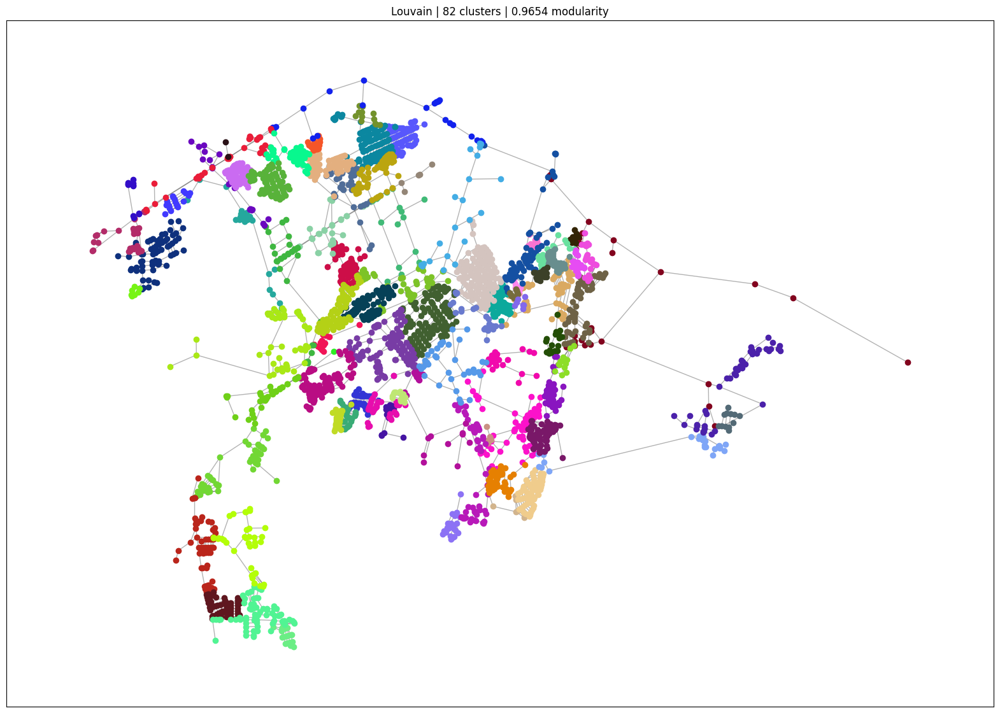

In [13]:
def plot_communities(communities, algo_name=''):
    plt.figure(figsize=(20, 14))

    nx.draw_networkx_edges(G, pos, alpha=0.3)

    for j, cluster in enumerate(communities):
        color = '#%06X' % randint(0, 0xFFFFFF)
        for v in cluster:
            point = pos[v]
            plt.scatter(point[0], point[1], c=color)

    plt.title(f'{algo_name} | {len(communities)} clusters | {score:.4f} modularity')

plot_communities(communities, 'Louvain')

## Leiden

Modularity: 0.96612


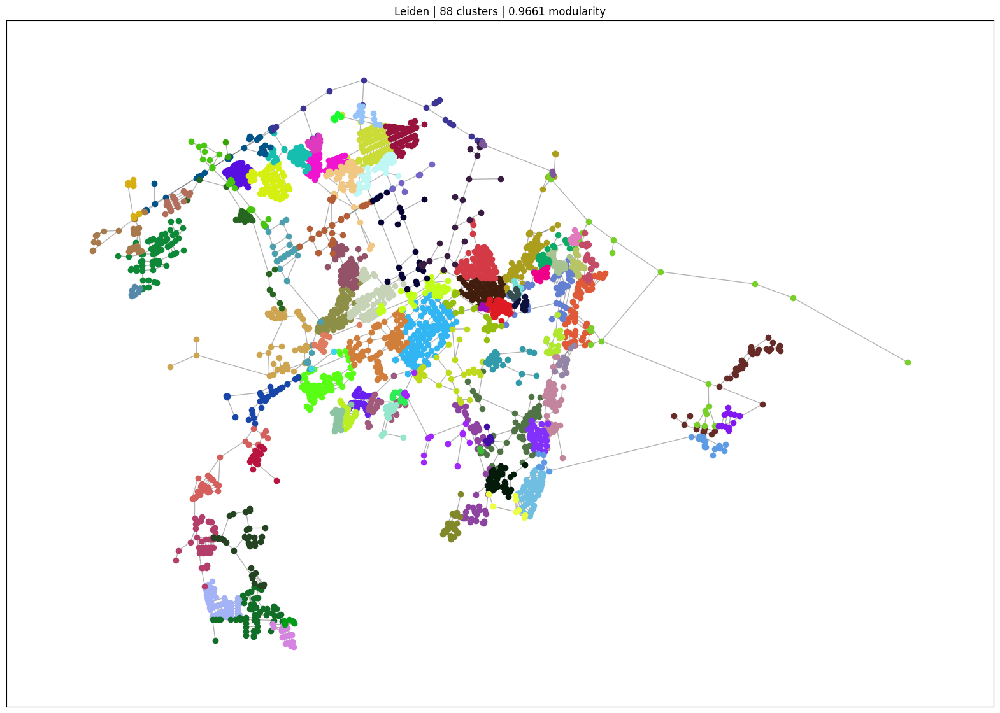

In [14]:
import leidenalg as la

seed = 0

communities = clustering.leiden(G, partition_type=la.ModularityVertexPartition, seed=seed, weights='length')
score = nx.community.modularity(G, communities, weight='length')
print(f'Modularity: {score:.5f}')

plot_communities(communities, 'Leiden')

## Filtration

 --- k=3 --- 
Louvain Modularity: 0.98248
Leiden Modularity: 0.98247
 --- k=5 --- 
Louvain Modularity: 0.97083
Leiden Modularity: 0.97118
 --- k=7 --- 
Louvain Modularity: 0.96348
Leiden Modularity: 0.96381
 --- k=10 --- 
Louvain Modularity: 0.95217
Leiden Modularity: 0.95252
 --- k=15 --- 
Louvain Modularity: 0.94045
Leiden Modularity: 0.94111


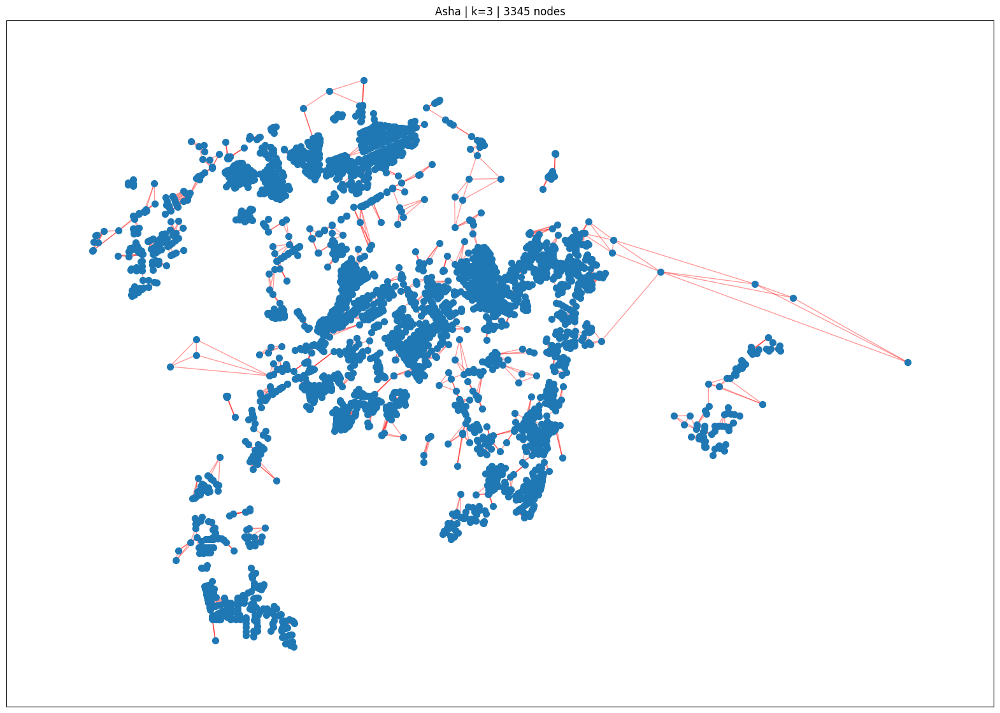

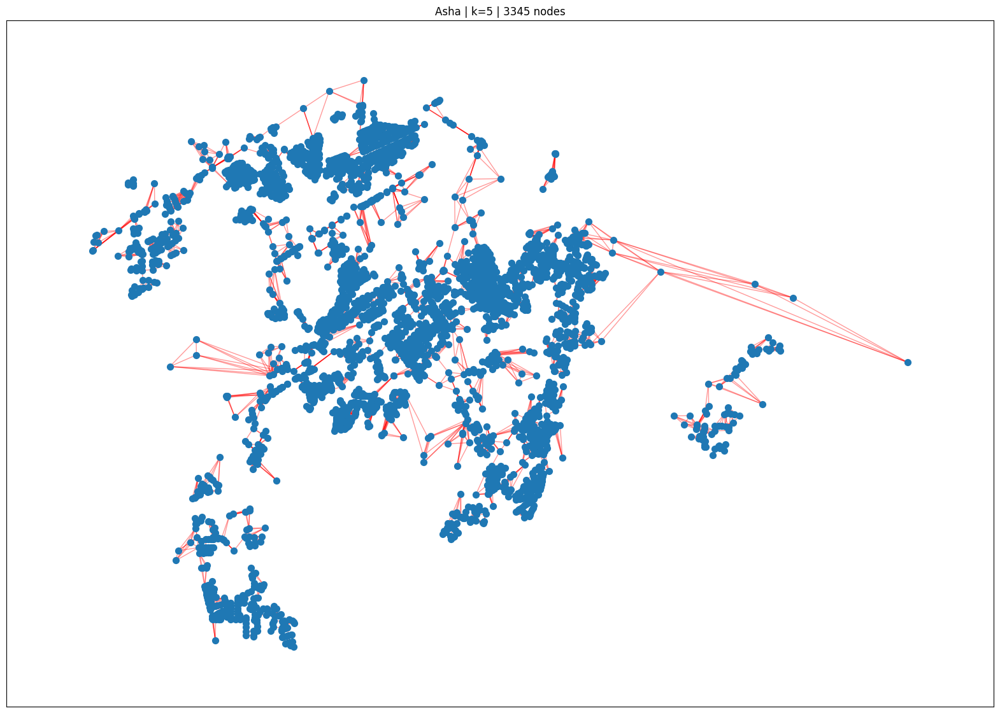

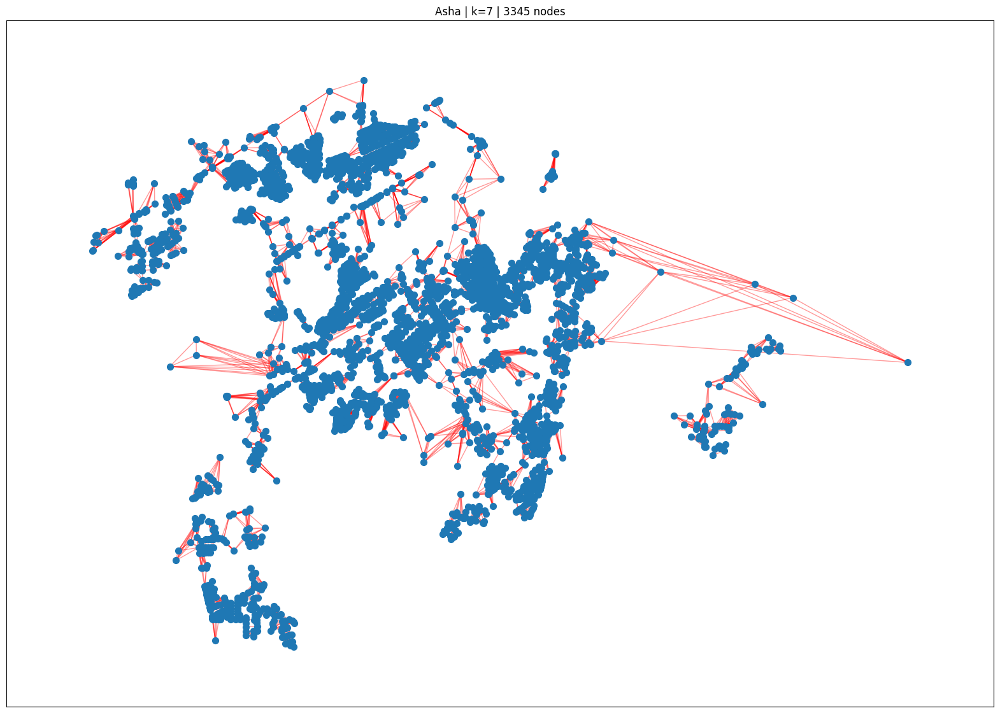

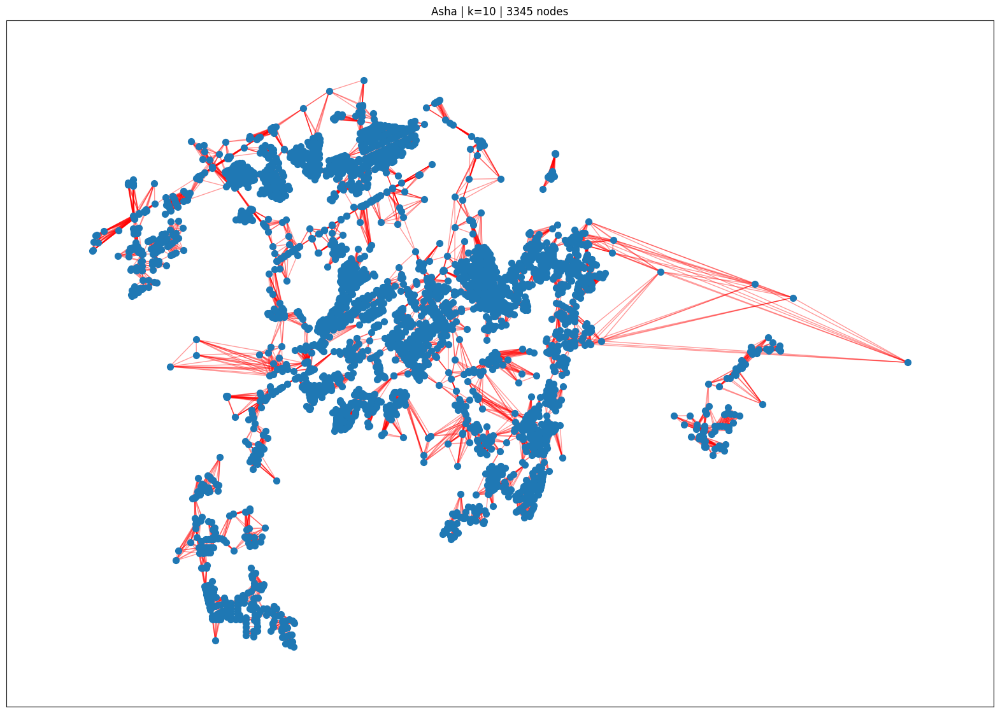

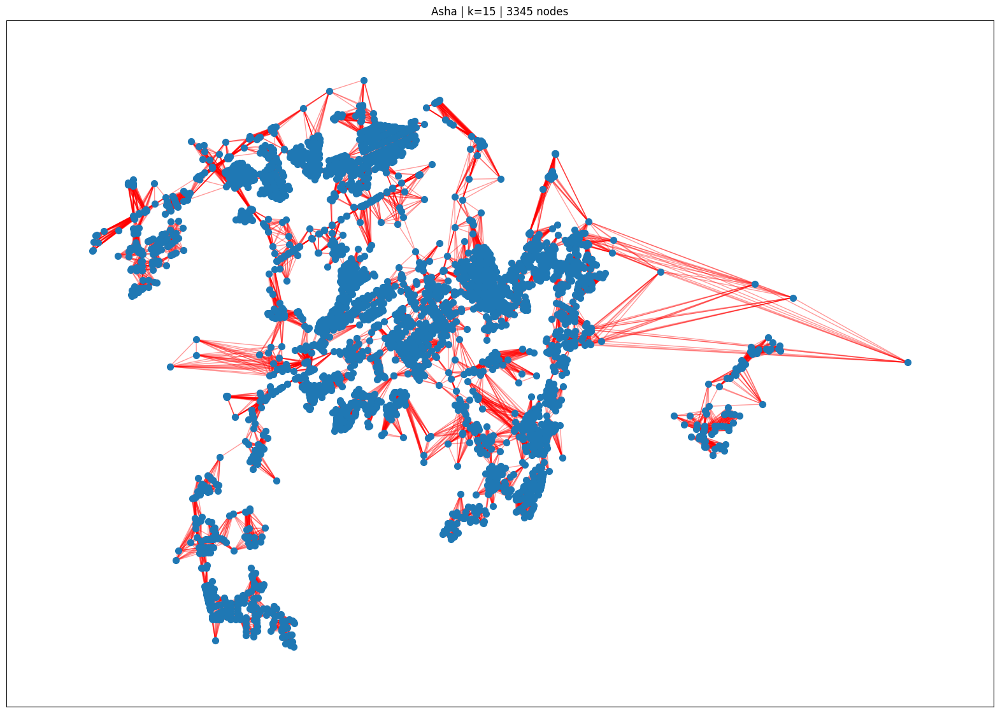

In [15]:
knn_graph = {k : build_knn_graph(G, k=k, weight='length') for k in [3, 5, 7, 10, 15]}

for k, G_knn in knn_graph.items():
    print(f' --- k={k} --- ')

    plt.figure(figsize=(20, 14))
    nx.draw_networkx_nodes(G, pos, node_size=50)
    nx.draw_networkx_edges(G_knn, pos, alpha=0.4, edge_color='r')
    plt.title(f'Asha | k={k} | {len(G.nodes)} nodes')

    communities = nx.community.louvain_communities(G_knn, weight='length')
    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'Louvain Modularity: {score:.5f}')

    communities = clustering.leiden(G_knn, partition_type=la.ModularityVertexPartition, seed=seed, weights='length')
    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'Leiden Modularity: {score:.5f}')

 --- k=3 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:16<00:00,  5.97it/s]


Finding best clustering


100%|██████████| 100/100 [00:00<00:00, 138.06it/s]


Best threshold 120.6988 with score: 0.9071299360901373


100%|██████████| 10/10 [00:01<00:00,  6.36it/s]


k = 3 | Modularity: 0.91306
 --- k=5 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:15<00:00,  6.51it/s]


Finding best clustering


100%|██████████| 100/100 [00:00<00:00, 113.26it/s]


Best threshold 13625.3777 with score: 0.9200308554678507


100%|██████████| 10/10 [00:01<00:00,  6.58it/s]


k = 5 | Modularity: 0.92137
 --- k=7 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:12<00:00,  8.10it/s]


Finding best clustering


100%|██████████| 100/100 [00:01<00:00, 97.62it/s]


Best threshold 14329.8026 with score: 0.9372106904315473


100%|██████████| 10/10 [00:05<00:00,  1.90it/s]


k = 7 | Modularity: 0.93867
 --- k=10 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:10<00:00,  9.25it/s]


Finding best clustering


100%|██████████| 100/100 [00:01<00:00, 79.44it/s]


Best threshold 14898.1372 with score: 0.8740595203069773


 40%|████      | 4/10 [00:02<00:03,  1.74it/s]


k = 10 | Modularity: 0.87478
 --- k=15 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:09<00:00, 10.16it/s]


Finding best clustering


100%|██████████| 100/100 [00:01<00:00, 60.99it/s]


Best threshold 2082.0997 with score: 0.8421499589031559


100%|██████████| 10/10 [00:05<00:00,  1.96it/s]


k = 15 | Modularity: 0.84754


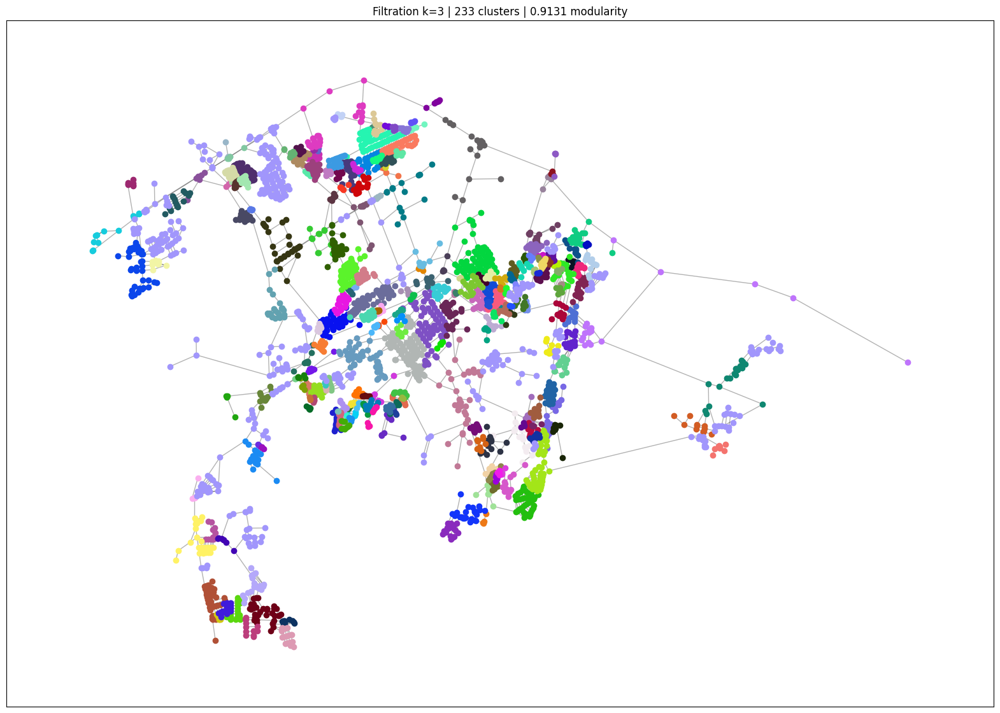

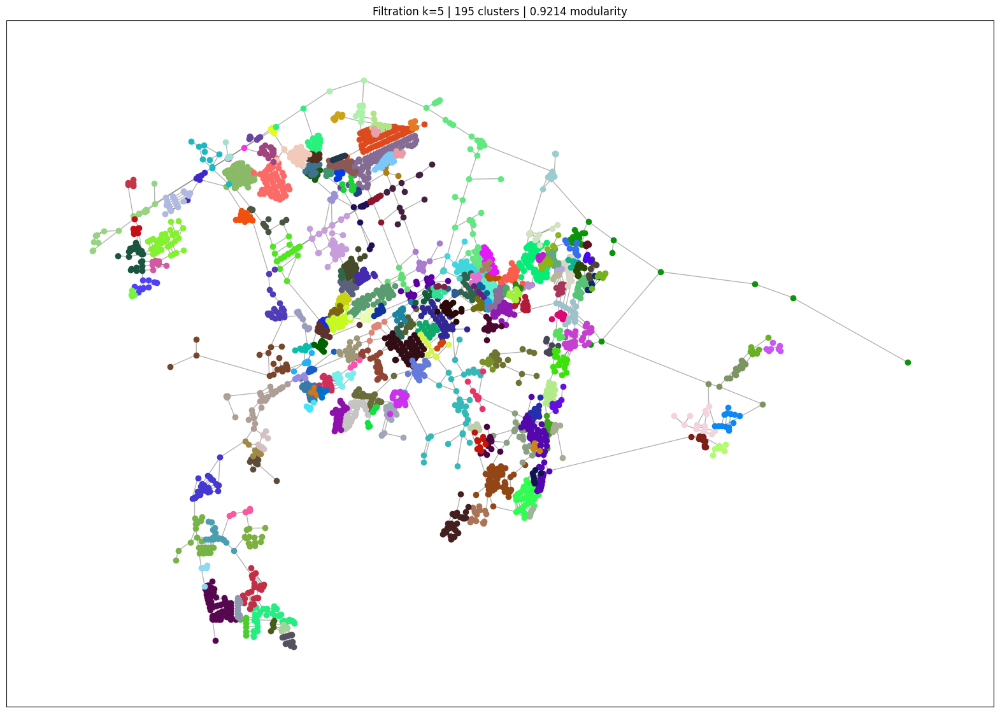

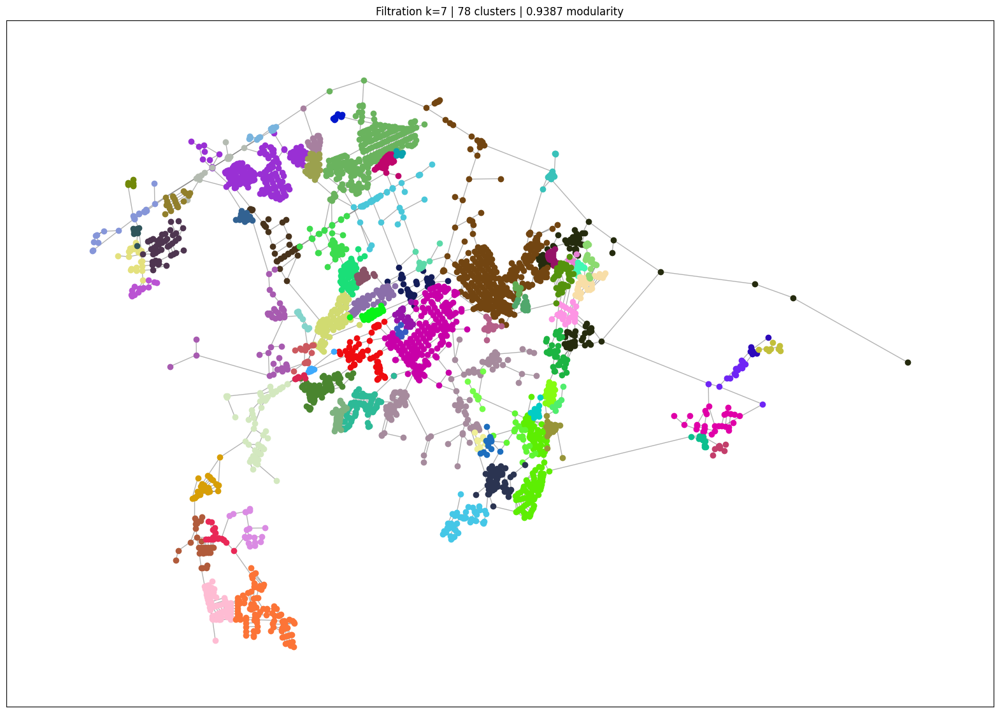

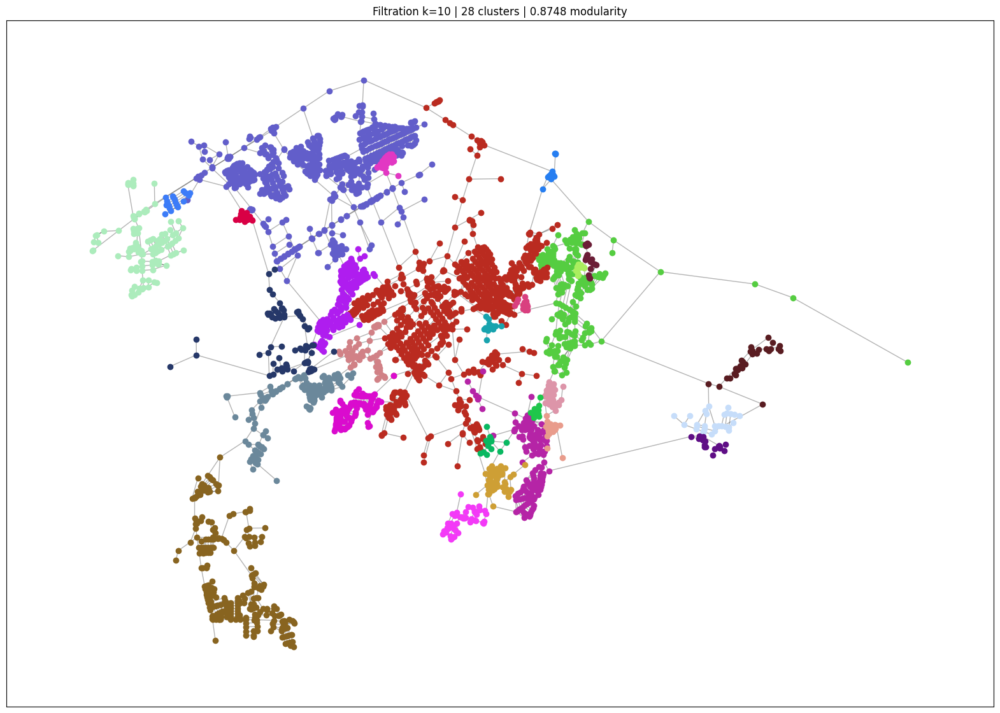

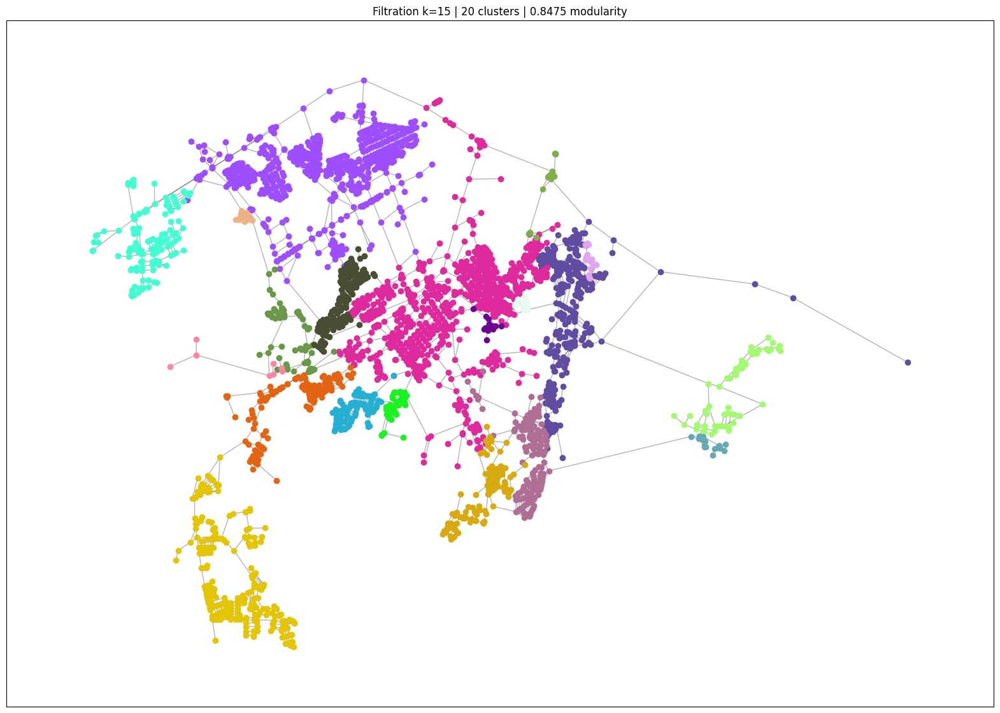

In [16]:
np.random.seed(0)

for k, G_knn in knn_graph.items():
    print(f' --- k={k} --- ')
    fc = FiltrationClustering(G_knn)
    communities = fc.cluster(n_jobs=7)

    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'k = {k} | Modularity: {score:.5f}')

    plot_communities(communities, f'Filtration k={k}')

# EKB

Text(0.5, 1.0, 'Asha | 5608 nodes')

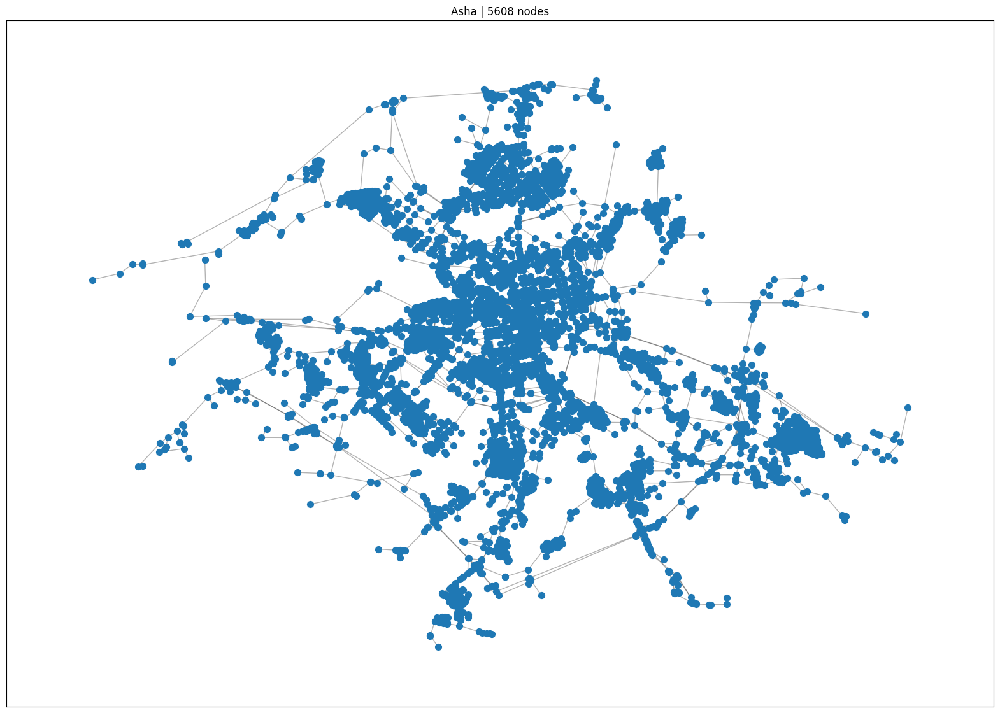

In [17]:
CITY = 'EKB'
GRAPH_ID = graph_osm_loader.cities[CITY] # KRG

# примеры id есть в graph_osm_loader.py
G = graph_osm_loader.get_graph(GRAPH_ID) # загрузка графа

pos = {u: [d['x'], d['y']] for u,d in G.nodes(data=True)} 

A = nx.adjacency_matrix(G, weight='length').todense()


plt.figure(figsize=(20, 14))
nx.draw_networkx_nodes(G, pos, node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.3)
plt.title(f'Asha | {len(G.nodes)} nodes')

In [18]:
d_dict = dict(nx.all_pairs_dijkstra_path_length(G, weight='length'))
d_matrix = np.zeros((len(G.nodes), len(G.nodes)))
id_to_order = {id : order for order, id in enumerate(G.nodes)}

for row in d_dict:
    for v in d_dict[row]:
        d_matrix[id_to_order[row]][id_to_order[v]] = d_dict[row][v]

## Louvain

In [19]:
communities = nx.community.louvain_communities(G, weight='length')
score = nx.community.modularity(G, communities, weight='length')
print(f'Modularity: {score:.5f}')

Modularity: 0.97114


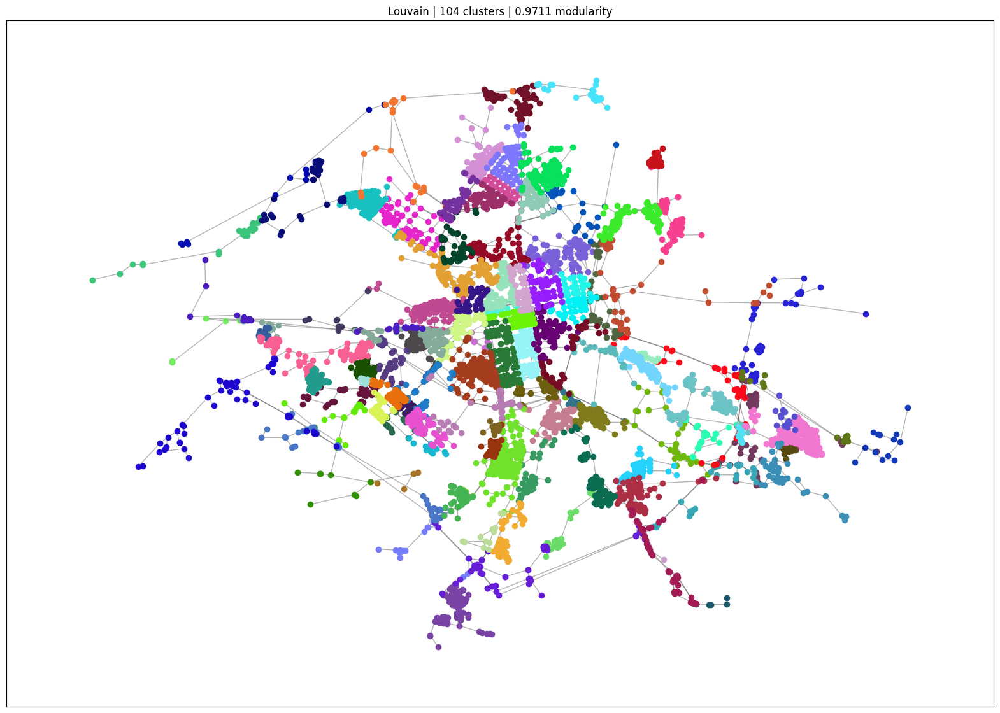

In [20]:
def plot_communities(communities, algo_name=''):
    plt.figure(figsize=(20, 14))

    nx.draw_networkx_edges(G, pos, alpha=0.3)

    for j, cluster in enumerate(communities):
        color = '#%06X' % randint(0, 0xFFFFFF)
        for v in cluster:
            point = pos[v]
            plt.scatter(point[0], point[1], c=color)

    plt.title(f'{algo_name} | {len(communities)} clusters | {score:.4f} modularity')

plot_communities(communities, 'Louvain')

## Leiden

Modularity: 0.97145


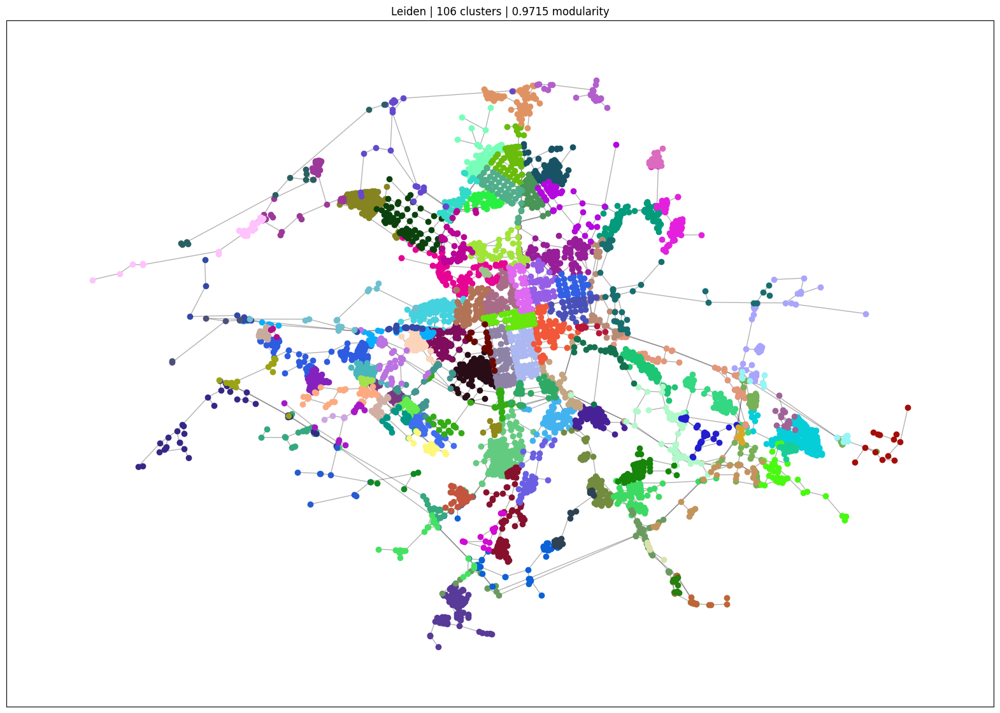

In [21]:
import leidenalg as la

seed = 0

communities = clustering.leiden(G, partition_type=la.ModularityVertexPartition, seed=seed, weights='length')
score = nx.community.modularity(G, communities, weight='length')
print(f'Modularity: {score:.5f}')

plot_communities(communities, 'Leiden')

## Filtration

 --- k=3 --- 
Louvain Modularity: 0.98739
Leiden Modularity: 0.98757
 --- k=5 --- 
Louvain Modularity: 0.97610
Leiden Modularity: 0.97639
 --- k=7 --- 
Louvain Modularity: 0.96854
Leiden Modularity: 0.96906
 --- k=10 --- 
Louvain Modularity: 0.95919
Leiden Modularity: 0.96017
 --- k=15 --- 
Louvain Modularity: 0.94567
Leiden Modularity: 0.94705


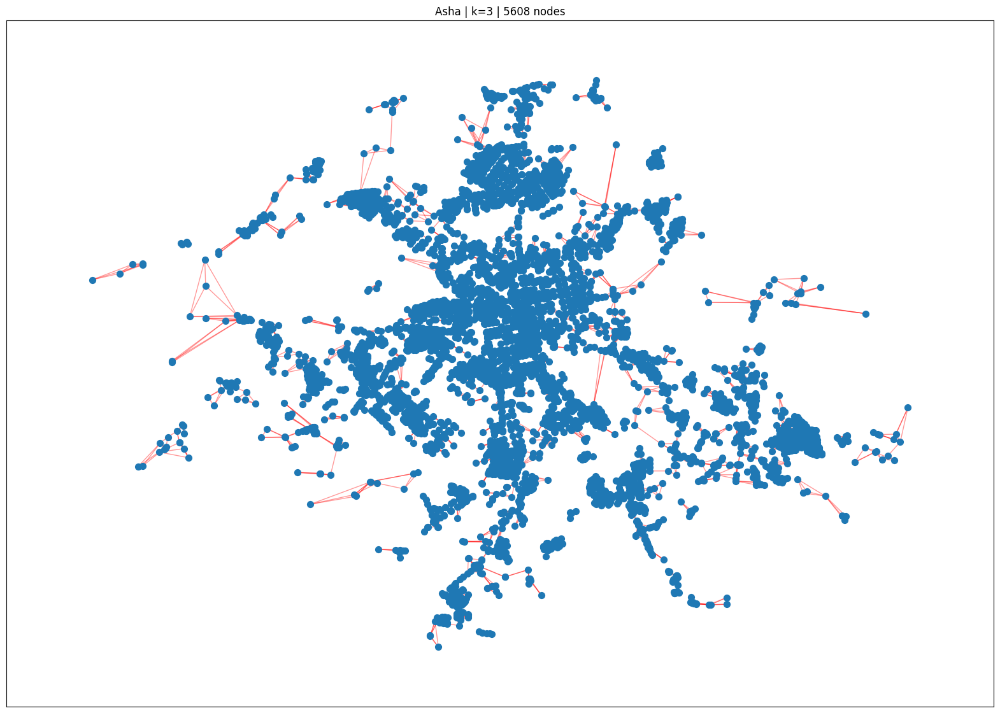

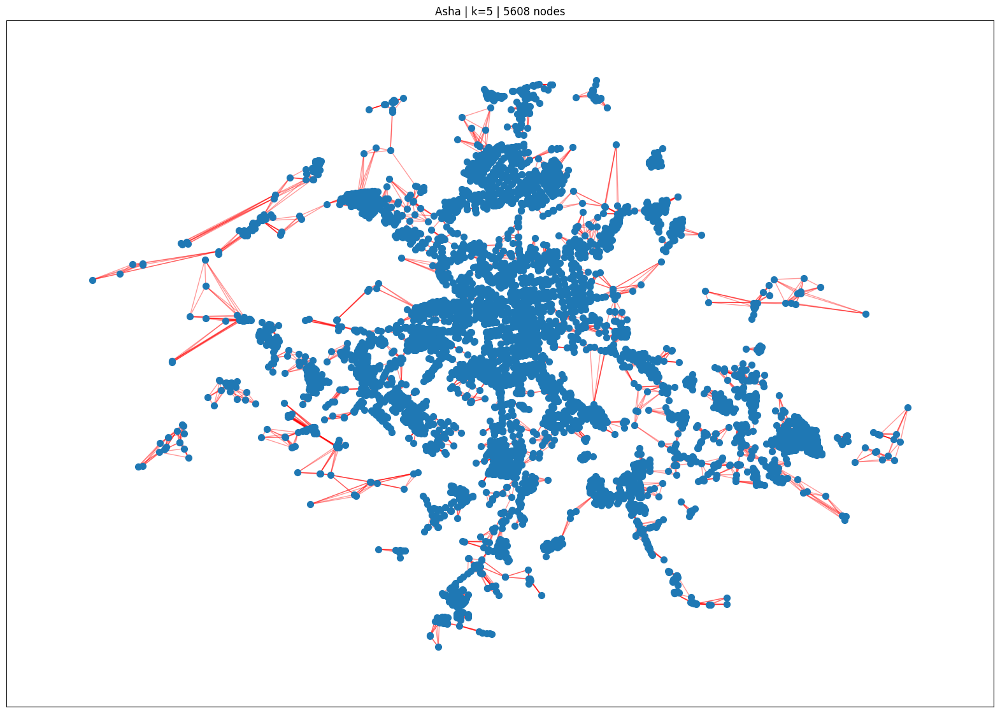

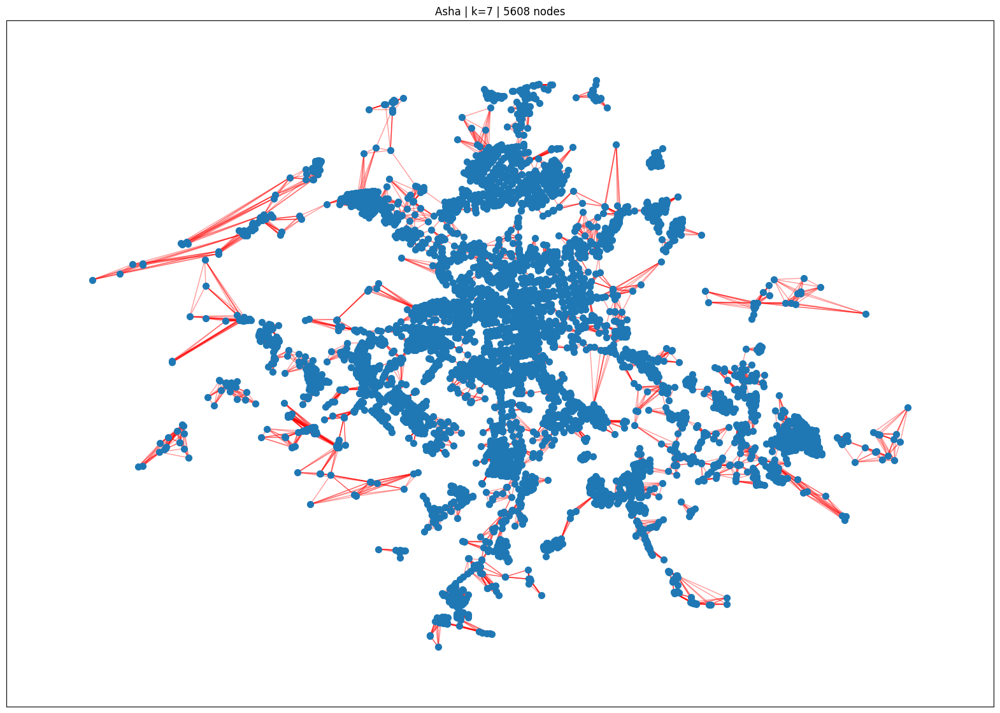

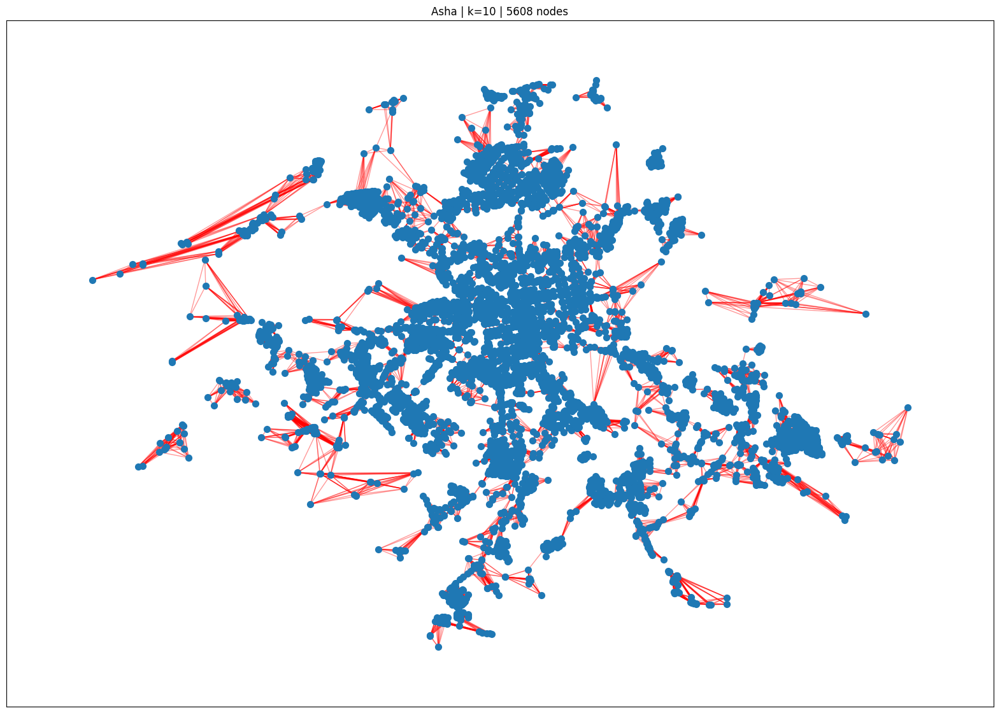

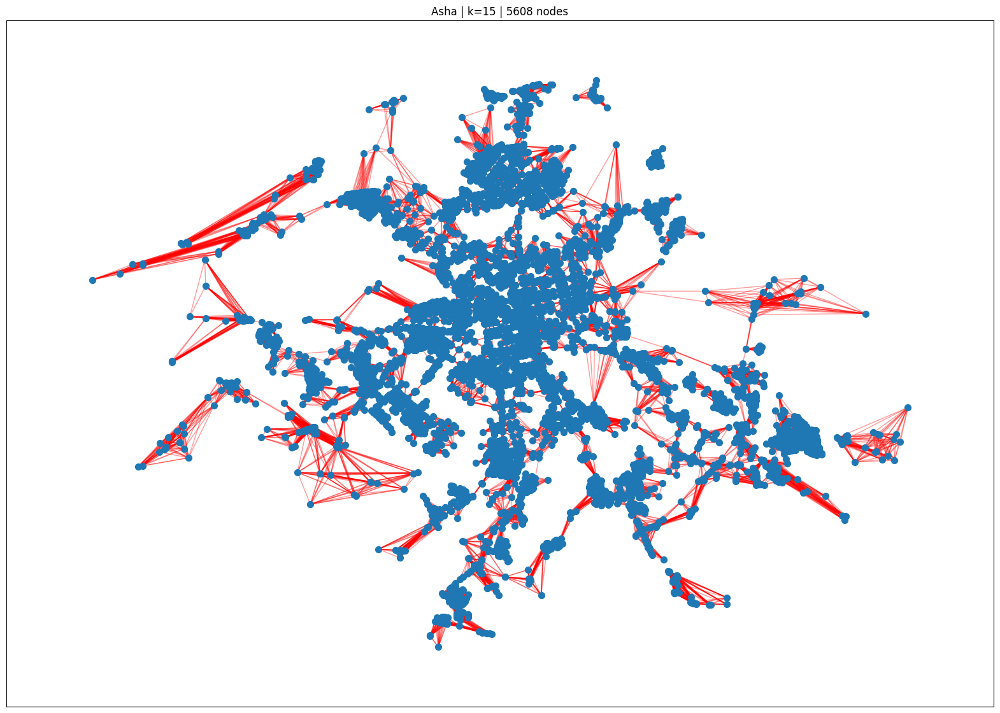

In [22]:
knn_graph = {k : build_knn_graph(G, k=k, weight='length') for k in [3, 5, 7, 10, 15]}

for k, G_knn in knn_graph.items():
    print(f' --- k={k} --- ')

    plt.figure(figsize=(20, 14))
    nx.draw_networkx_nodes(G, pos, node_size=50)
    nx.draw_networkx_edges(G_knn, pos, alpha=0.4, edge_color='r')
    plt.title(f'Asha | k={k} | {len(G.nodes)} nodes')

    communities = nx.community.louvain_communities(G_knn, weight='length')
    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'Louvain Modularity: {score:.5f}')

    communities = clustering.leiden(G_knn, partition_type=la.ModularityVertexPartition, seed=seed, weights='length')
    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'Leiden Modularity: {score:.5f}')

 --- k=3 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:44<00:00,  2.26it/s]


Finding best clustering


100%|██████████| 100/100 [00:01<00:00, 79.60it/s]


Best threshold 95.1556 with score: 0.9281558073754972


100%|██████████| 10/10 [00:01<00:00,  7.83it/s]


k = 3 | Modularity: 0.92911
 --- k=5 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:38<00:00,  2.61it/s]


Finding best clustering


100%|██████████| 100/100 [00:01<00:00, 63.95it/s]


Best threshold 7057.2343 with score: 0.8989166597940176


100%|██████████| 10/10 [00:11<00:00,  1.11s/it]


k = 5 | Modularity: 0.89945
 --- k=7 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:34<00:00,  2.93it/s]


Finding best clustering


100%|██████████| 100/100 [00:01<00:00, 53.61it/s]


Best threshold 8167.6667 with score: 0.9369821402330312


100%|██████████| 10/10 [00:07<00:00,  1.37it/s]


k = 7 | Modularity: 0.93801
 --- k=10 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:29<00:00,  3.43it/s]


Finding best clustering


100%|██████████| 100/100 [00:02<00:00, 44.01it/s]


Best threshold 102.1779 with score: 0.7595116785273759


100%|██████████| 10/10 [00:09<00:00,  1.07it/s]


k = 10 | Modularity: 0.75988
 --- k=15 --- 
Performing Filtration Clustering


100%|██████████| 100/100 [00:24<00:00,  4.15it/s]


Finding best clustering


100%|██████████| 100/100 [00:02<00:00, 34.31it/s]


Best threshold 577.4532 with score: 0.6593691647070099


100%|██████████| 10/10 [00:18<00:00,  1.89s/it]


k = 15 | Modularity: 0.66063


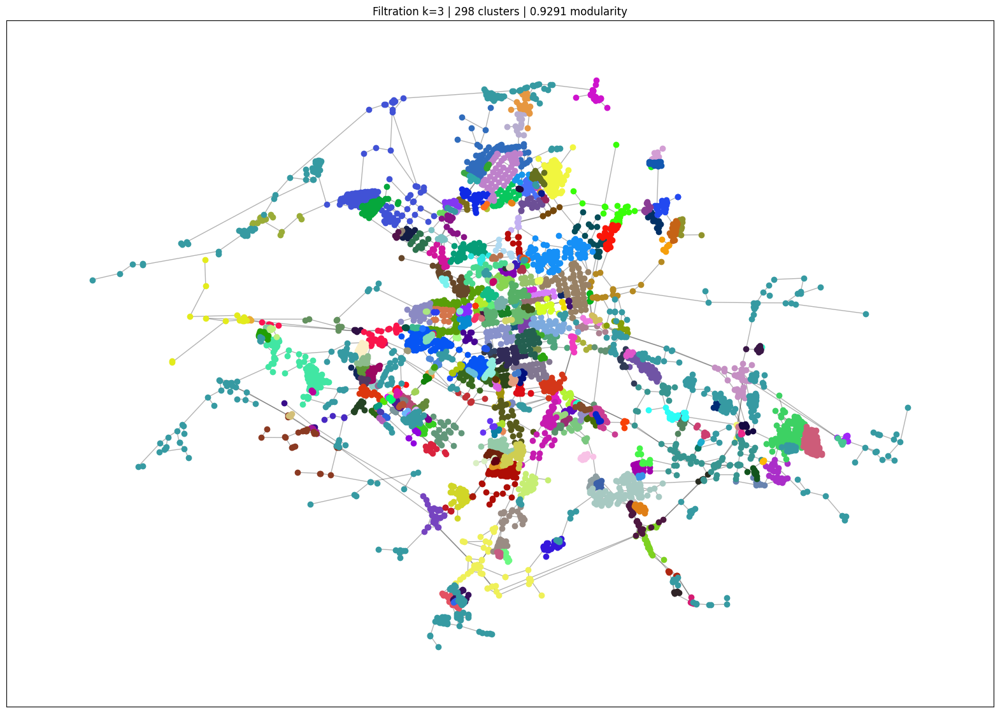

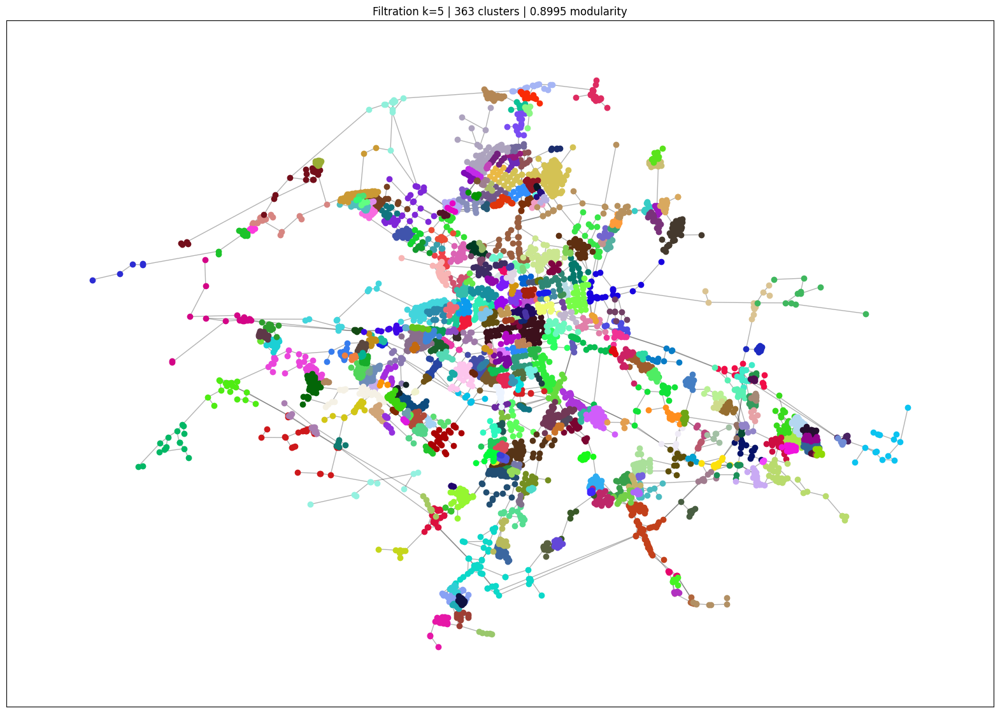

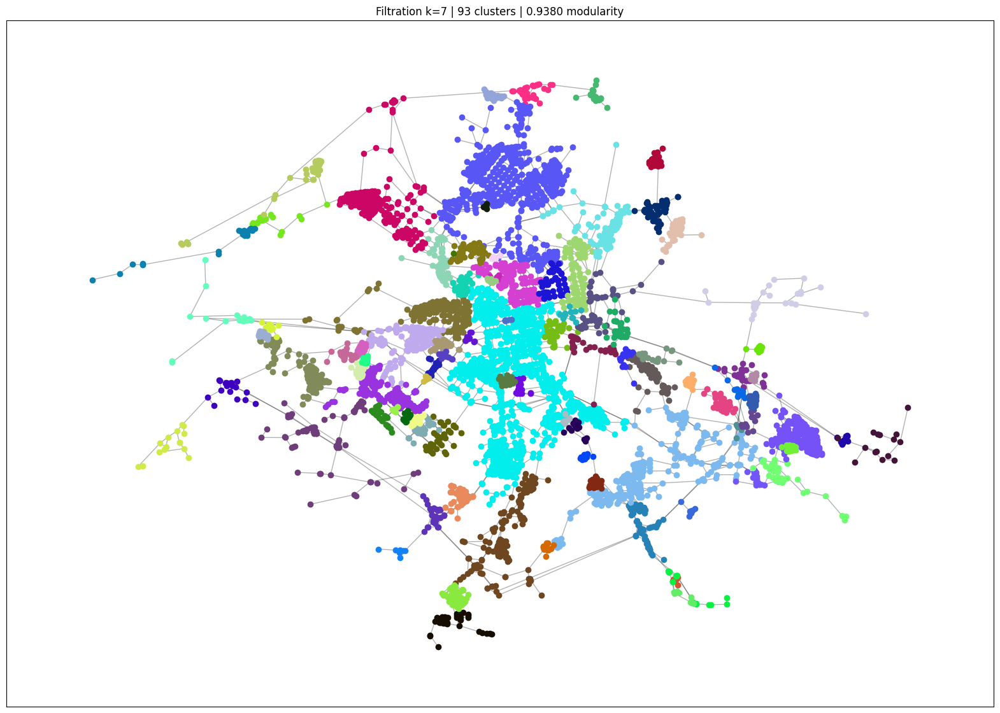

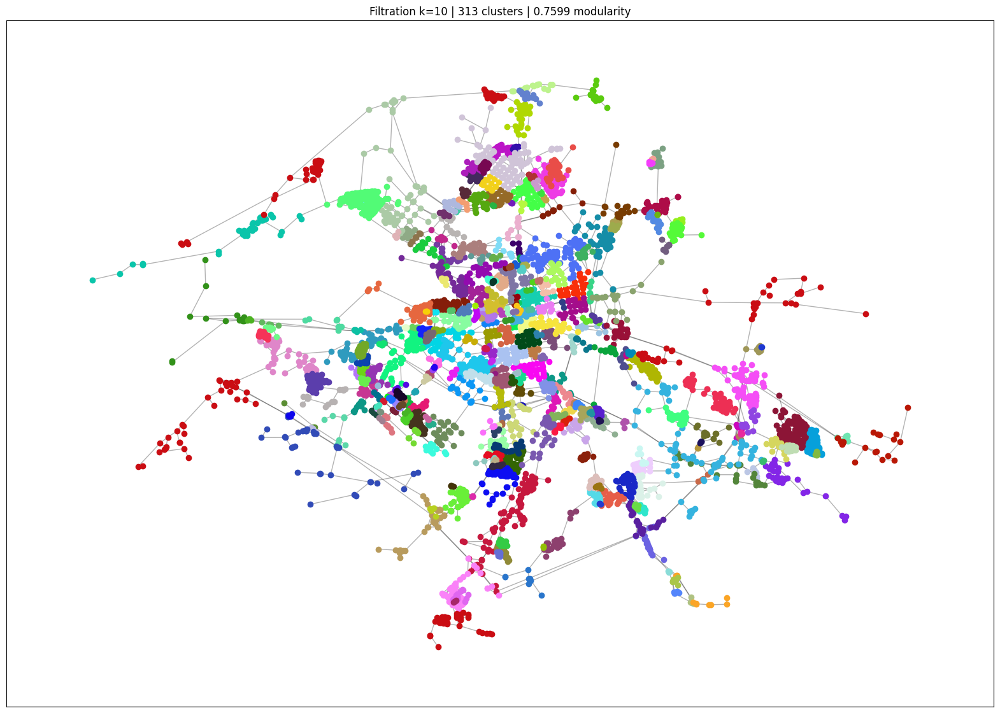

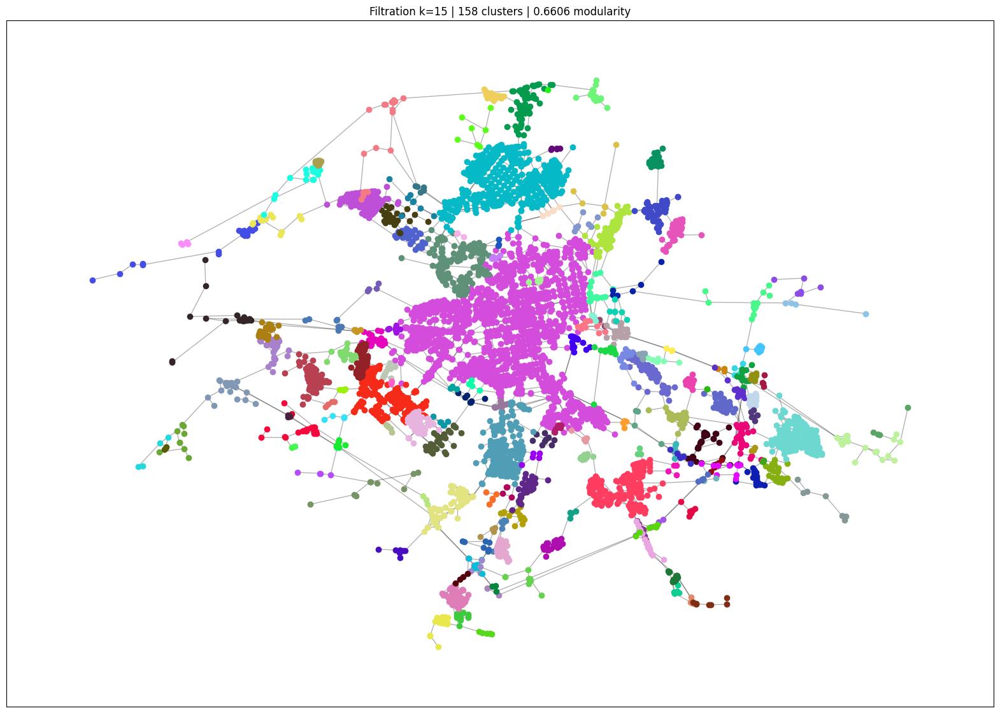

In [23]:
np.random.seed(0)

for k, G_knn in knn_graph.items():
    print(f' --- k={k} --- ')
    fc = FiltrationClustering(G_knn)
    communities = fc.cluster(n_jobs=7)

    score = nx.community.modularity(G_knn, communities, weight='length')
    print(f'k = {k} | Modularity: {score:.5f}')

    plot_communities(communities, f'Filtration k={k}')